In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
import numpy as np
import random
from tensorflow.keras.models import load_model
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.applications.mobilenet_v2 import preprocess_input
from sklearn.metrics import classification_report, confusion_matrix
from tensorflow.keras.preprocessing.image import load_img 
from tensorflow.keras.preprocessing.image import img_to_array
from vis.utils import utils
from vis.visualization import visualize_cam, overlay
import matplotlib.pyplot as plt 

%matplotlib inline

Using TensorFlow backend.


In [3]:
# configuration parameters 
TEST_DATA_DIR = '/Users/sanchit/Documents/Projects/Datasets/fire_and_smoke_data/test/'
MODEL_PATH = "./models/mobilenetv2_.h5"
TEST_SAMPLES = 430
NUM_CLASSES = 2
NUM_IMGS_PER_LABEL = 30 
IMG_WIDTH, IMG_HEIGHT = 224, 224
BATCH_SIZE = 64
LABELS = ["fire", "nofire"]

### Load trained model

In [4]:
model = load_model(MODEL_PATH)

### Load test data via generator

In [5]:
test_datagen = ImageDataGenerator(preprocessing_function=preprocess_input)
test_generator = test_datagen.flow_from_directory(
    TEST_DATA_DIR,
    target_size=(IMG_WIDTH, IMG_HEIGHT),
    batch_size=BATCH_SIZE,
    shuffle=False,
    class_mode='categorical')

Found 430 images belonging to 2 classes.


In [6]:
def get_corr_classified_imgs(y_true: list, y_pred: list, filenames: list, class_label: int):
    """ randomly sampling "N" images from a given class label given it has been predicted correctly
        :param y_true: a list of true (or ground-truth) labels 
        :param y_pred: a list of predicted labels 
        :param filenames: a list of filenames corresponding to the true labels
        :param class_label: class label for which correctly classified N number of randomly sampled images are returned
    """
    # find all the indices given a class label in both y_pred and y_true and 
    # convert them into sets
    ind_pred = set(np.where(y_pred==class_label)[0])
    ind_true = set(np.where(y_true==class_label)[0])
    
    # find interection between the both indices so that correctly classified indices for 
    # a given class class can be found out 
    ind_corr_classes = ind_pred.intersection(ind_true)
    
    # find N number of indices randomly from correctly classified of a given class label
    ind_corr_classes = random.sample(ind_corr_classes, NUM_IMGS_PER_LABEL)
    
    # extracts the file paths of those correctly classified images belonging to a particular class label
    file_paths = [filenames[ind_corr] for ind_corr in ind_corr_classes]
    
    print(file_paths)
    
    return file_paths

In [7]:
y_pred = model.predict_generator(test_generator, steps=TEST_SAMPLES // BATCH_SIZE + 1)
y_pred = np.argmax(y_pred, axis=1)

Instructions for updating:
Please use Model.predict, which supports generators.


In [8]:
def img_predict(filename: str):
    org_img = load_img(filename, target_size=(IMG_WIDTH, IMG_HEIGHT)) 
    preprocessed_img = img_to_array(org_img)
    preprocessed_img = np.expand_dims(preprocessed_img, 0)
    preprocessed_img = preprocess_input(preprocessed_img)
    preds = model.predict(preprocessed_img)
    #plt.imshow(org_img)
    #plt.show()
    return org_img, preprocessed_img, preds

In [9]:
# get the last closest layer to the output but before the softmax layer. It's length should be the same as the 
# number of output classes
layer_idx = utils.find_layer_idx(model, 'last_dense')  

# get the last conv layer (in the shape of UxVxK) which linear relationship with the output classes need to be 
# visualized. Note: it could be any CONV layer inside of the model, the results are worse because they only focus on 
# less semantic local features while on other hand last CONV layer has highest semantic class-specific information 
# in the image. 
penultimate_layer_idx = utils.find_layer_idx(model, 'out_relu') # conv_pw_13_relu or conv_pw_13 

In [10]:
# plot and visualize Grad-CAM for the class with the highest prediction.
def plot_map(grads, _img, pred_label, true_label, prob_pred):    
    fig, axes = plt.subplots(1,2,figsize=(14,5))
    axes[0].imshow(_img)
    axes[1].imshow(_img)
    i = axes[1].imshow(grads,cmap="jet",alpha=0.8)
    fig.colorbar(i)
    plt.suptitle("Predicted class highest Prob(class={}({}))={:5.2f} and true class={}({})".format(
                      LABELS[pred_label], 
                      pred_label,
                      prob_pred, 
                      LABELS[true_label], 
                      true_label))

['/Users/sanchit/Documents/Projects/Datasets/fire_and_smoke_data/test/fire/img_115.jpg', '/Users/sanchit/Documents/Projects/Datasets/fire_and_smoke_data/test/fire/img_433.jpg', '/Users/sanchit/Documents/Projects/Datasets/fire_and_smoke_data/test/fire/img_647.jpg', '/Users/sanchit/Documents/Projects/Datasets/fire_and_smoke_data/test/fire/793.jpg', '/Users/sanchit/Documents/Projects/Datasets/fire_and_smoke_data/test/fire/1130.jpg', '/Users/sanchit/Documents/Projects/Datasets/fire_and_smoke_data/test/fire/987.jpg', '/Users/sanchit/Documents/Projects/Datasets/fire_and_smoke_data/test/fire/979.jpg', '/Users/sanchit/Documents/Projects/Datasets/fire_and_smoke_data/test/fire/img_88.jpg', '/Users/sanchit/Documents/Projects/Datasets/fire_and_smoke_data/test/fire/img_653.jpg', '/Users/sanchit/Documents/Projects/Datasets/fire_and_smoke_data/test/fire/627.jpg', '/Users/sanchit/Documents/Projects/Datasets/fire_and_smoke_data/test/fire/932.jpg', '/Users/sanchit/Documents/Projects/Datasets/fire_and_sm

/anaconda3/envs/tf_venv_2.1/lib/python3.7/site-packages/ipykernel_launcher.py:3: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  This is separate from the ipykernel package so we can avoid doing imports until


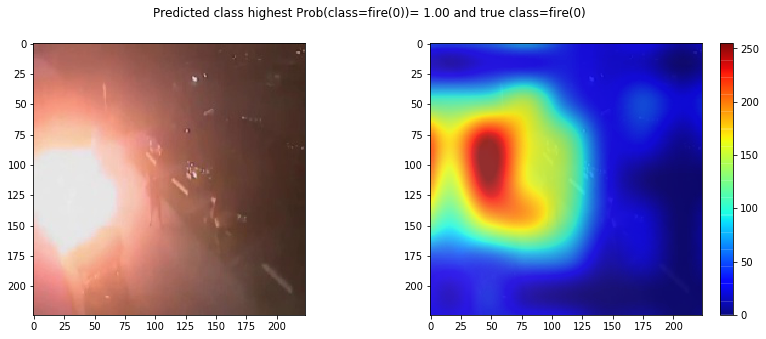

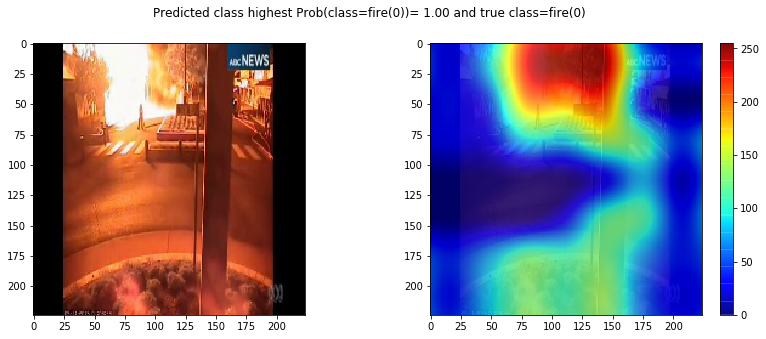

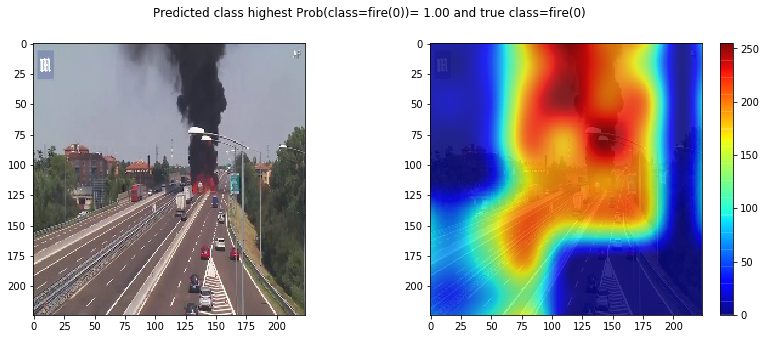

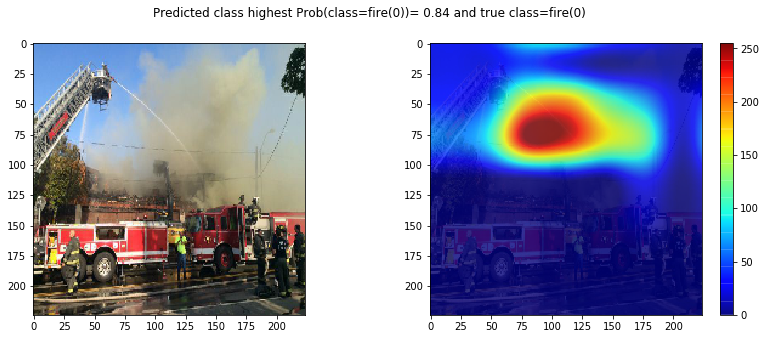

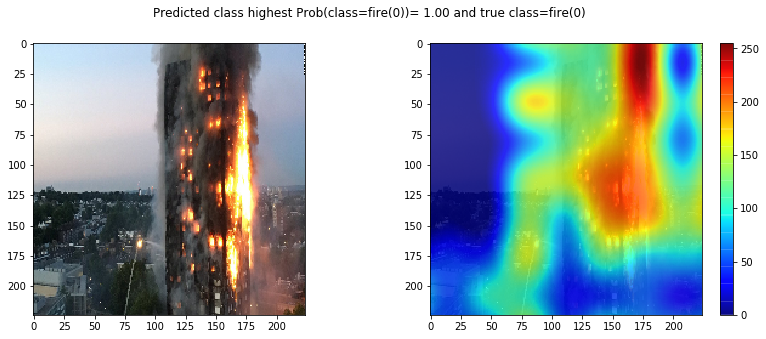

...

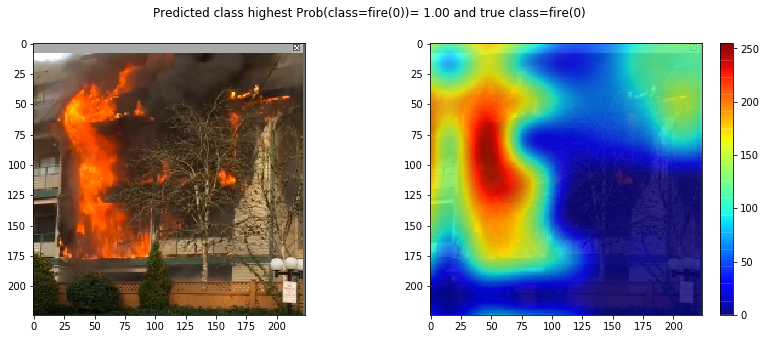

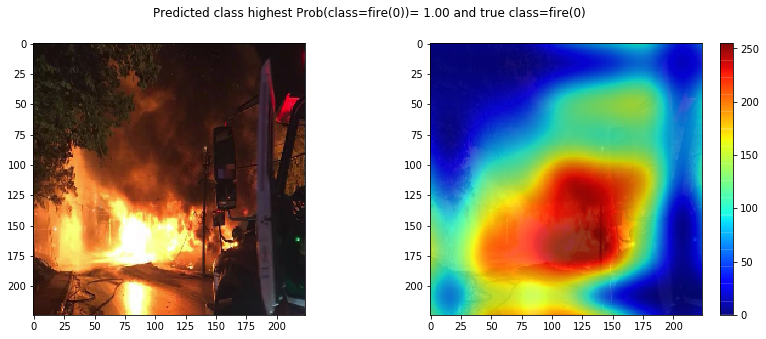

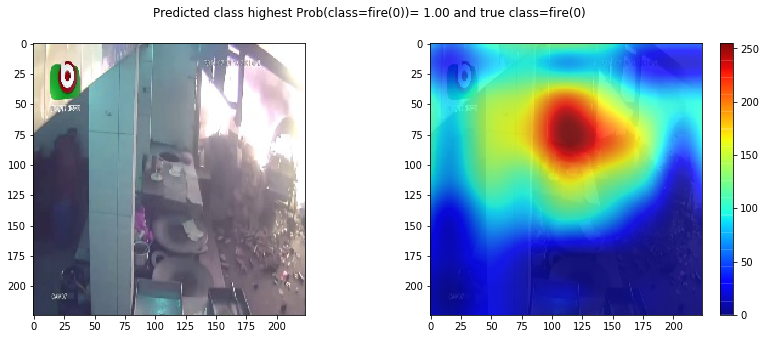

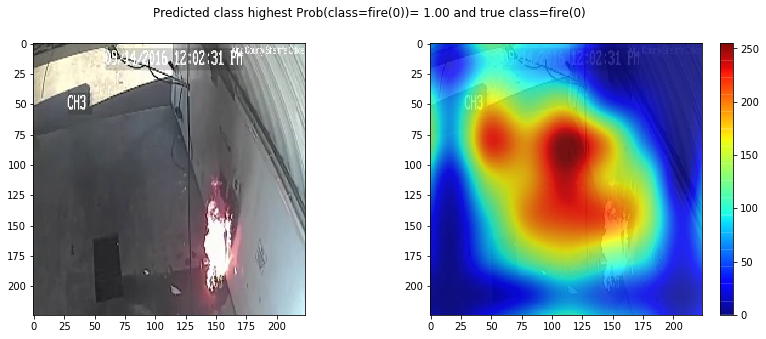

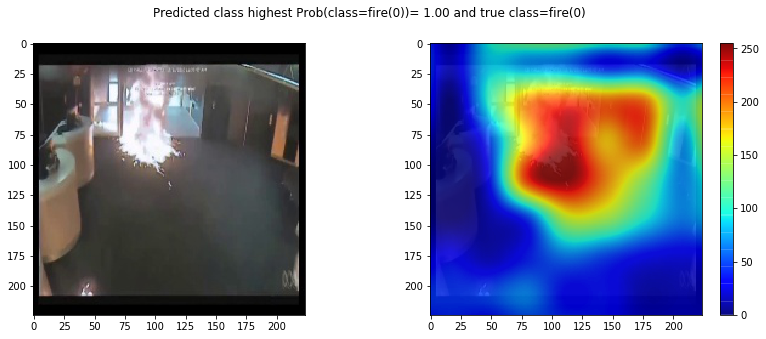

In [11]:
class_label = 0
list_img_paths = get_corr_classified_imgs(test_generator.classes, y_pred, test_generator.filepaths, class_label)
for img_path in list_img_paths:
    org_img, preprocessed_img, preds = img_predict(img_path)
    grads  = visualize_cam(model, 
                           layer_idx, 
                           filter_indices=np.argmax(preds), 
                           seed_input=preprocessed_img,
                           penultimate_layer_idx = penultimate_layer_idx,
                           backprop_modifier     = None,
                           grad_modifier         = None)
    
    plot_map(grads, org_img, class_label, class_label, preds[0, np.argmax(preds)])

['/Users/sanchit/Documents/Projects/Datasets/fire_and_smoke_data/test/no_fire/760.jpg', '/Users/sanchit/Documents/Projects/Datasets/fire_and_smoke_data/test/no_fire/512.jpg', '/Users/sanchit/Documents/Projects/Datasets/fire_and_smoke_data/test/no_fire/701.jpg', '/Users/sanchit/Documents/Projects/Datasets/fire_and_smoke_data/test/no_fire/894.jpg', '/Users/sanchit/Documents/Projects/Datasets/fire_and_smoke_data/test/no_fire/insidecity_art735.jpg', '/Users/sanchit/Documents/Projects/Datasets/fire_and_smoke_data/test/no_fire/coast_sun5.jpg', '/Users/sanchit/Documents/Projects/Datasets/fire_and_smoke_data/test/no_fire/forest_nat211.jpg', '/Users/sanchit/Documents/Projects/Datasets/fire_and_smoke_data/test/no_fire/268.jpg', '/Users/sanchit/Documents/Projects/Datasets/fire_and_smoke_data/test/no_fire/7.jpg', '/Users/sanchit/Documents/Projects/Datasets/fire_and_smoke_data/test/no_fire/coast_natu818.jpg', '/Users/sanchit/Documents/Projects/Datasets/fire_and_smoke_data/test/no_fire/coast_nat899.

/anaconda3/envs/tf_venv_2.1/lib/python3.7/site-packages/ipykernel_launcher.py:3: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  This is separate from the ipykernel package so we can avoid doing imports until


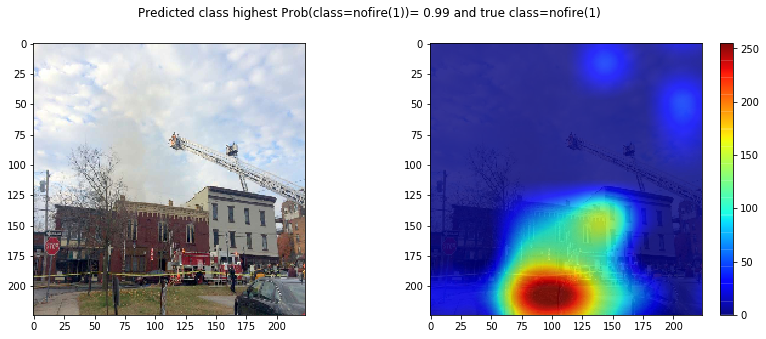

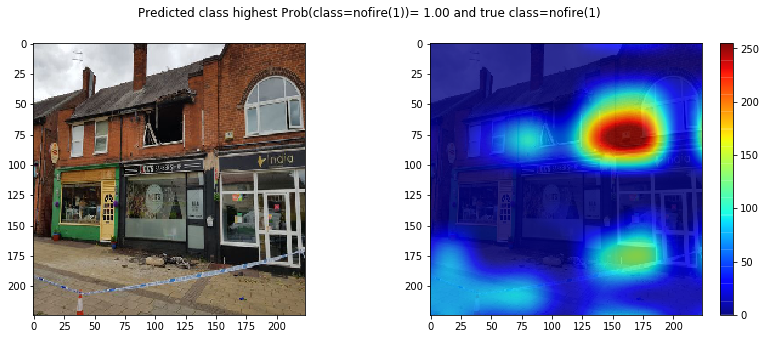

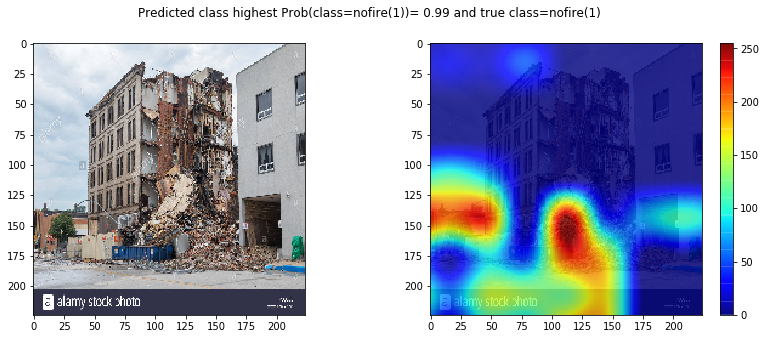

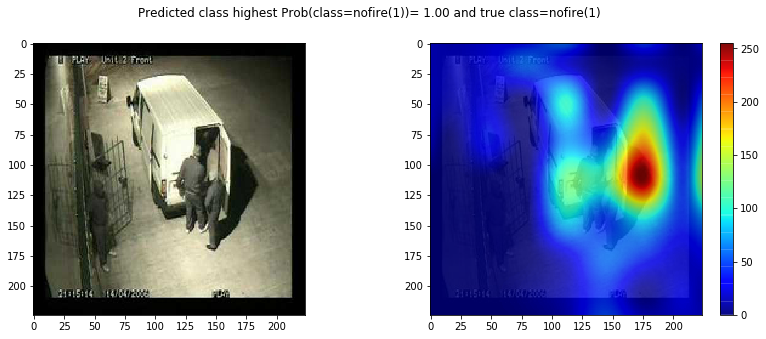

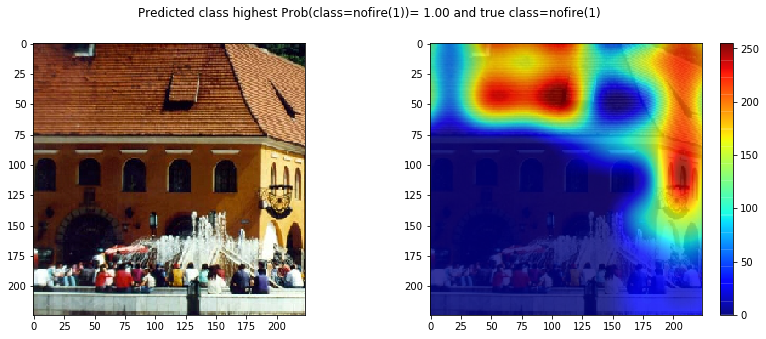

...

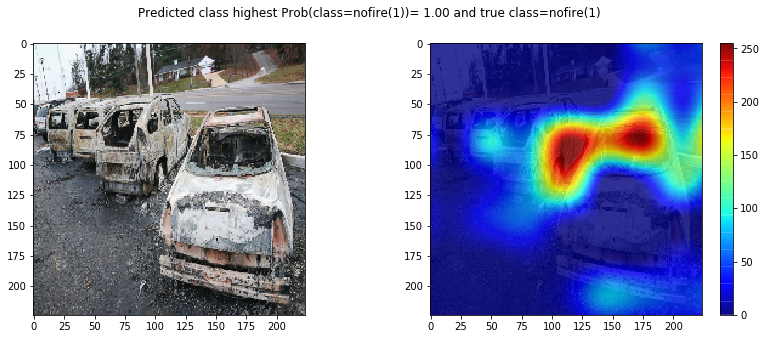

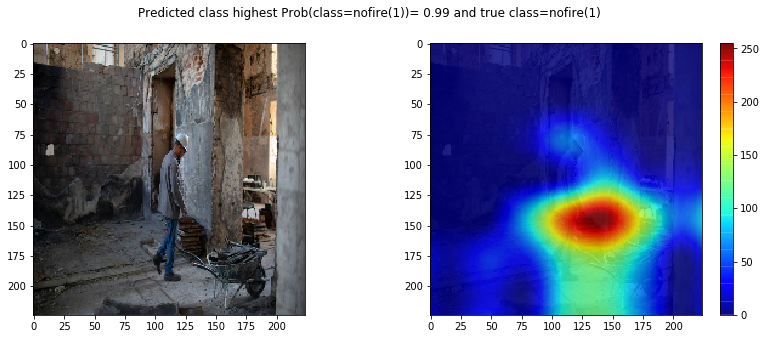

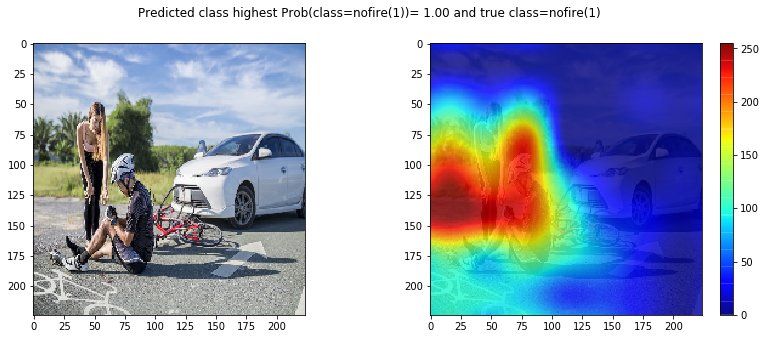

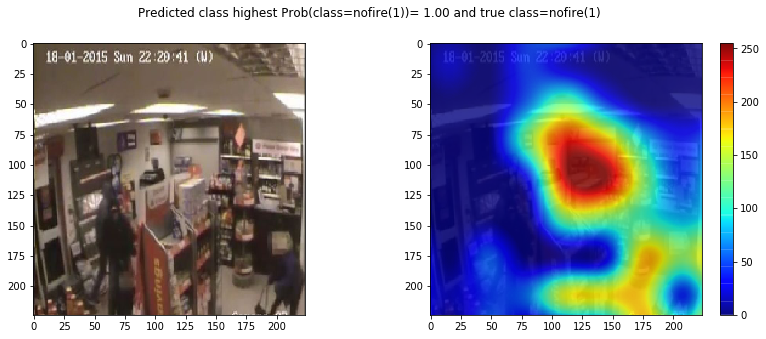

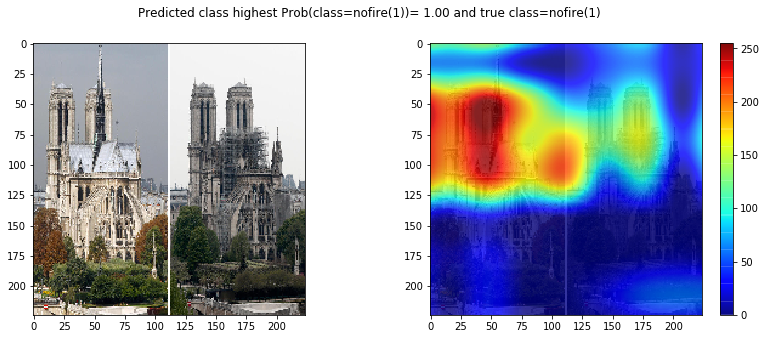

In [12]:
class_label = 1
list_img_paths = get_corr_classified_imgs(test_generator.classes, y_pred, test_generator.filepaths, class_label)
for img_path in list_img_paths:
    org_img, preprocessed_img, preds = img_predict(img_path)
    grads  = visualize_cam(model, 
                           layer_idx, 
                           filter_indices=np.argmax(preds), 
                           seed_input=preprocessed_img,
                           penultimate_layer_idx = penultimate_layer_idx,
                           backprop_modifier     = None,
                           grad_modifier         = None)
    
    plot_map(grads, org_img, class_label, class_label, preds[0, np.argmax(preds)])